In [1]:
%pylab inline

import astropy.io.fits as pyfits
from configparser import ConfigParser

from ddmap import halosim
from ddmap.pixel3D import cartesianGrid3D
from ddmap import halolet
from ddmap.halolet import massmap_ks2D

Populating the interactive namespace from numpy and matplotlib


In [31]:
# configuration
configName  =   '../../tests/config_sparse.ini' 
parser      =   ConfigParser()
parser.read(configName)

# Reconstruction Init
parser.set('lens','resolve_lim','0.1') #pix
parser.set('lens','rs_base','0.5955')    #Mpc/h
parser.set('sparse','nframe','1' )

# Pixelation
gridInfo=   cartesianGrid3D(parser)
Z,Y,X   =   np.meshgrid(gridInfo.zcgrid,gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')
x,y,z   =   (X.flatten(),Y.flatten(),Z.flatten())
lensKer1=   gridInfo.lensing_kernel(deltaIn=False)
modelDict=  halolet.nfwShearlet2D(parser,lensKer1)

In [51]:
z_h     =  0.2425
log_m   =  15.6
M_200   =  10.**(log_m)
conc    =  4.#6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo    =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
lk      =  halo.lensKernel(z)
data0   =  halo.Sigma(x*3600.,y*3600.)
data0   =  data0.reshape(gridInfo.shape)
print(np.sum(data0[1]))
data0[:,gridInfo.ny//2,gridInfo.nx//2]=0.
print(np.sum(data0[1]))

data1   =  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lk
data1   =  data1.reshape(gridInfo.shape)
np.testing.assert_almost_equal(modelDict.rs_frame[4],halo.rs_arcsec/gridInfo.scale/3600.,3)

1.0837951243082821e+17
3.532590430247224e+16


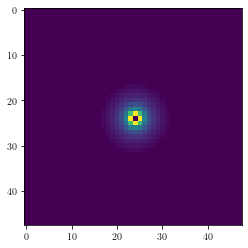

In [39]:
plt.imshow(data0[1])

1.0
9.697233876226651
8.974510828791868


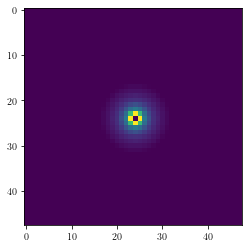

In [57]:
totest=np.fft.fftshift(np.fft.ifft2(modelDict.fouaframesInter[4,0]).real)
print(np.sum(totest)*dr**2)
print(np.sum(totest))
totest[gridInfo.ny//2,gridInfo.nx//2]=0.
plt.imshow(totest)
print(np.sum(totest))

3.5325904302472236e+16
3.532590430247224e+16
3.860538340660111e+16
3981071705534969.5


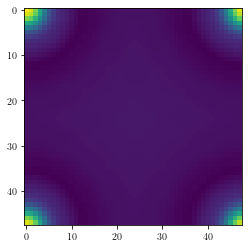

In [60]:
plt.imshow(np.abs(np.fft.fft2(data0[0])))
print(np.abs(np.fft.fft2(data0[0]))[0,0])
print(np.sum(data0[0]))
dr  =   halo.DaLens*gridInfo.scale/180*np.pi
print(M_200/dr**2.)
print(M_200)

5127461845348180.0


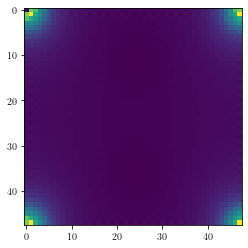

In [12]:
res=np.abs(dmapper.modelDict.aframes[4,0]-np.fft.ifftshift(shear))
print(np.sum(res))
plt.imshow(res)

# sparse analysis

CPU times: user 1.88 s, sys: 7.37 ms, total: 1.89 s
Wall time: 1.89 s


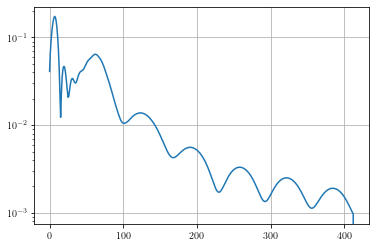

In [13]:
%%time
if False:
    dmapper.lbd=8.
    dmapper.lcd=0.
    dmapper.nonNeg=True
    dmapper.clean_outcomes()
    dmapper.fista_gradient_descent(3000)
else:
    dmapper.lbd=0.
    dmapper.lcd=1.
    dmapper.nonNeg=False
    dmapper.clean_outcomes()
    dmapper.optimized_gradient_descent(3000)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 12.4 s, sys: 0 ns, total: 12.4 s
Wall time: 12.4 s


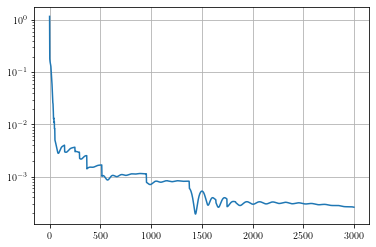

In [14]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 13.3 s, sys: 0 ns, total: 13.3 s
Wall time: 13.4 s


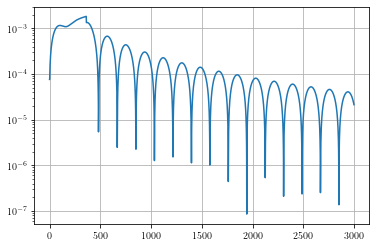

In [15]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

In [16]:
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(dmapper.deltaR[:,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

In [17]:
src

iz,iy,ix,value
float64,float64,float64,float64
5.0,24.0,24.0,69.3428806664921


In [1]:
plt.imshow(dmapper.deltaR[2])
plt.colorbar()

NameError: name 'dmapper' is not defined